In [1]:
import pandas as pd
import numpy as np
import os
import yaml

In [2]:
CONFIG_FILE = '../configs/config.yaml'
with open(CONFIG_FILE) as file:
    yml = yaml.load(file)
MODEL_DIR_NAME = yml['SETTING']['MODEL_DIR_NAME']
FEATURE_DIR_NAME = yml['SETTING']['FEATURE_DIR_NAME']

In [3]:
DIR = './sub/'
sorted(os.listdir(DIR))

['.DS_Store',
 'lgb_KFold_06281730_submission.csv',
 'lgb_KFold_06281904_submission.csv',
 'lgb_KFold_06281934_submission.csv',
 'lgb_KFold_06282001_submission.csv']

In [4]:
sub1 = pd.read_csv(DIR + 'lgb_KFold_06281730_submission.csv')
sub2 = pd.read_csv(DIR + 'lgb_KFold_06281904_submission.csv')
sub3 = pd.read_csv(DIR + 'lgb_KFold_06281934_submission.csv')
sub4 = pd.read_csv(DIR + 'lgb_KFold_06282001_submission.csv')

In [5]:
sub1

,id,y
0,1,2.393140e+05
1,2,2.565162e+06
2,3,9.128135e+05
3,4,1.720173e+05
4,5,2.226087e+02
...,...,...
29577,29578,8.891836e+05
29578,29579,1.759897e+05
29579,29580,8.222745e+03
29580,29581,1.078757e+05


In [6]:
import plotly.express as px

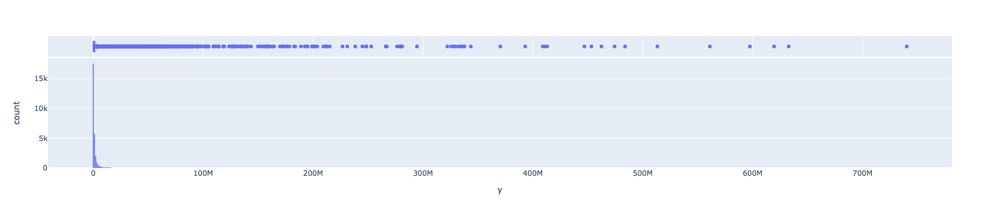

In [7]:
fig = px.histogram(sub1, x='y', width=1000, height=300, opacity=0.8, marginal='box')
fig.show()

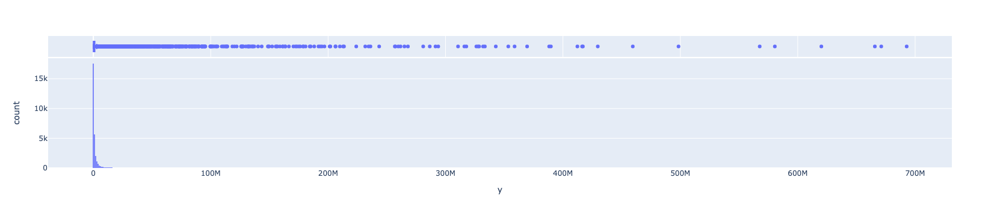

In [8]:
fig = px.histogram(sub2, x='y', width=1000, height=300, opacity=0.8, marginal='box')
fig.show()

## ブレンド

In [9]:
sub_final = sub1.copy()

In [10]:
sub_final.head()

,id,y
0,1,2.393140e+05
1,2,2.565162e+06
2,3,9.128135e+05
3,4,1.720173e+05
4,5,2.226087e+02


In [11]:
sub_final['y'] = sub1['y']*0.25 + sub2['y']*0.25 + sub3['y']*0.25 + sub4['y']*0.25

In [12]:
sub_final.head()

,id,y
0,1,2.336920e+05
1,2,2.646386e+06
2,3,8.968931e+05
3,4,1.726170e+05
4,5,2.264013e+02


In [13]:
sub_final.shape

(29582, 2)

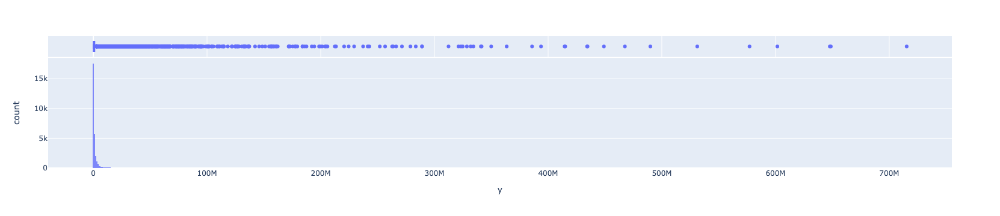

In [14]:
fig = px.histogram(sub_final, x='y', width=1000, height=300, opacity=0.8, marginal='box')
fig.update_layout(barmode='overlay')
fig.show()

In [15]:
# pseudo_labelingにブレンドしたsubを使用する
sub_final.to_csv('sub_ensamble/sub_ensamble_20200628.csv', index=False)